In [1]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.core import *
import torch
from pathlib import Path
import numpy as np
import cv2
import os
import sys
import shutil
import re
import gc
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from classifier_common import *
from heatmaps import *

# segmenter_model = "/data/output/NLM_Shenzhen_Montgomery-06/segmentation-model.pkl"
# classifier_model = "/data/output/pytorch-extended_v2-20201020_01/classifier-model.pkl"
classifier_model = "/data/output/pytorch-extended_v2-20201027_02/classifier-model.pkl"
test_dir = Path("/data/datasets/extended_v2_Masked/test")
test_csv = "/data/datasets/extended_v2_Masked/regions.csv"

In [2]:
regions_df = pd.read_csv(test_csv, index_col=0, dtype={"file": str})
regions_df

,x,y,width,height,confidence,class
file,,,,,,
/data/datasets/extended_v2_Masked/train/Pneumonia/SARS-10.1148rg.242035193-g04mr34g0-Fig8a-day0.jpeg,0,59,1692,1355,0.941239,Pneumonia
/data/datasets/extended_v2_Masked/train/Pneumonia/SARS-10.1148rg.242035193-g04mr34g0-Fig8b-day5.jpeg,0,0,1800,1518,0.940427,Pneumonia
/data/datasets/extended_v2_Masked/train/Pneumonia/SARS-10.1148rg.242035193-g04mr34g0-Fig8c-day10.jpeg,0,20,1783,1318,0.909923,Pneumonia
/data/datasets/extended_v2_Masked/train/Pneumonia/SARS-10.1148rg.242035193-g04mr34g04a-Fig4a-day7.jpeg,0,32,1772,1735,0.974390,Pneumonia
/data/datasets/extended_v2_Masked/train/Pneumonia/SARS-10.1148rg.242035193-g04mr34g04b-Fig4b-day12.jpeg,0,7,1708,1702,0.977359,Pneumonia
...,...,...,...,...,...,...
/data/datasets/extended_v2_Masked/evaluate/COVID-19/COVID-19-AR-16434409_01.png,356,422,2268,2002,0.934235,COVID-19
/data/datasets/extended_v2_Masked/evaluate/COVID-19/COVID-19-AR-16434444_01.png,368,322,2312,1851,0.908095,COVID-19
/data/datasets/extended_v2_Masked/evaluate/COVID-19/COVID-19-AR-16434444_02.png,343,468,2096,1601,0.929042,COVID-19


In [3]:
test_xrays = sorted(get_image_files(test_dir, recurse=True))
# n_files = len(test_xrays)
n_files = 256
step_size = 64
print(len(test_xrays), n_files, step_size)

1579 256 64


In [4]:
cropper = InputCropper(regions_df, min_confidence=0.875)
def get_cropped_image(im_file):
    return cropper.get_cropped_image(str(im_file))

classifier = load_learner(classifier_model, cpu=True)
classifier.freeze()

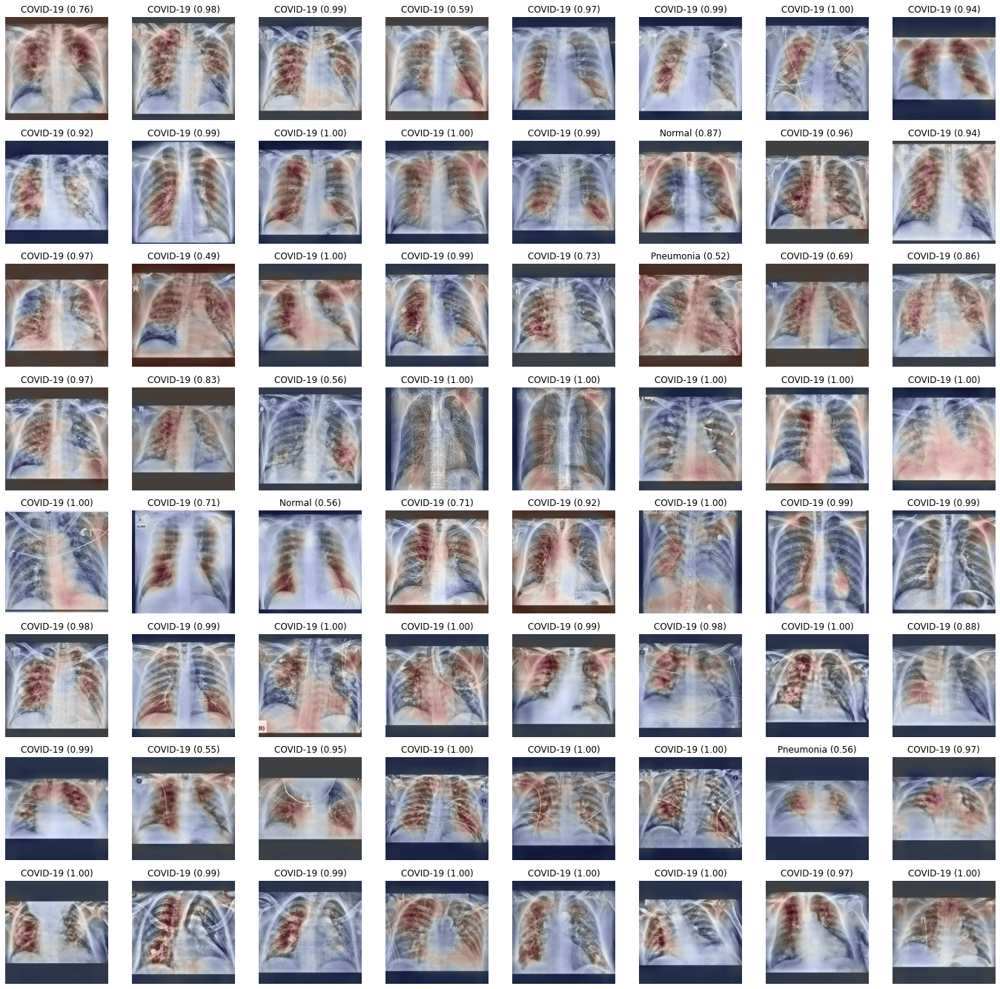

64 / 256


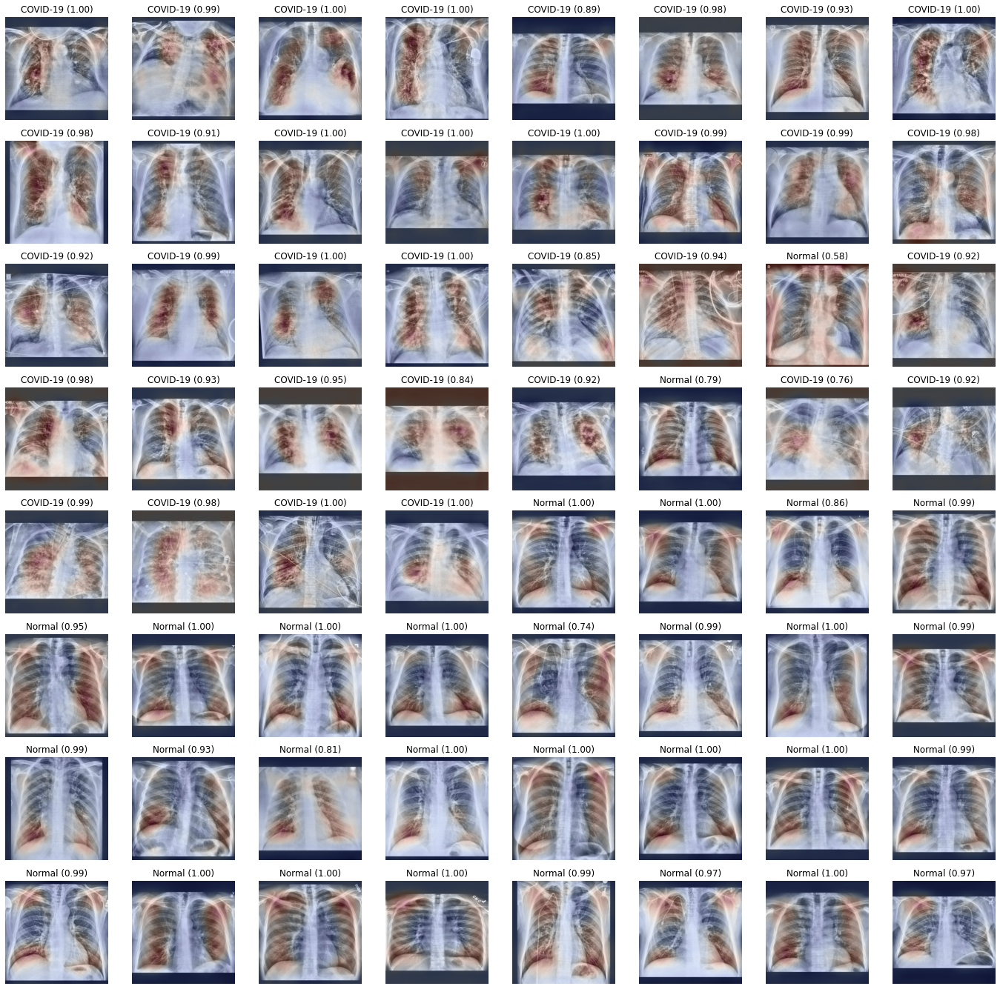

128 / 256


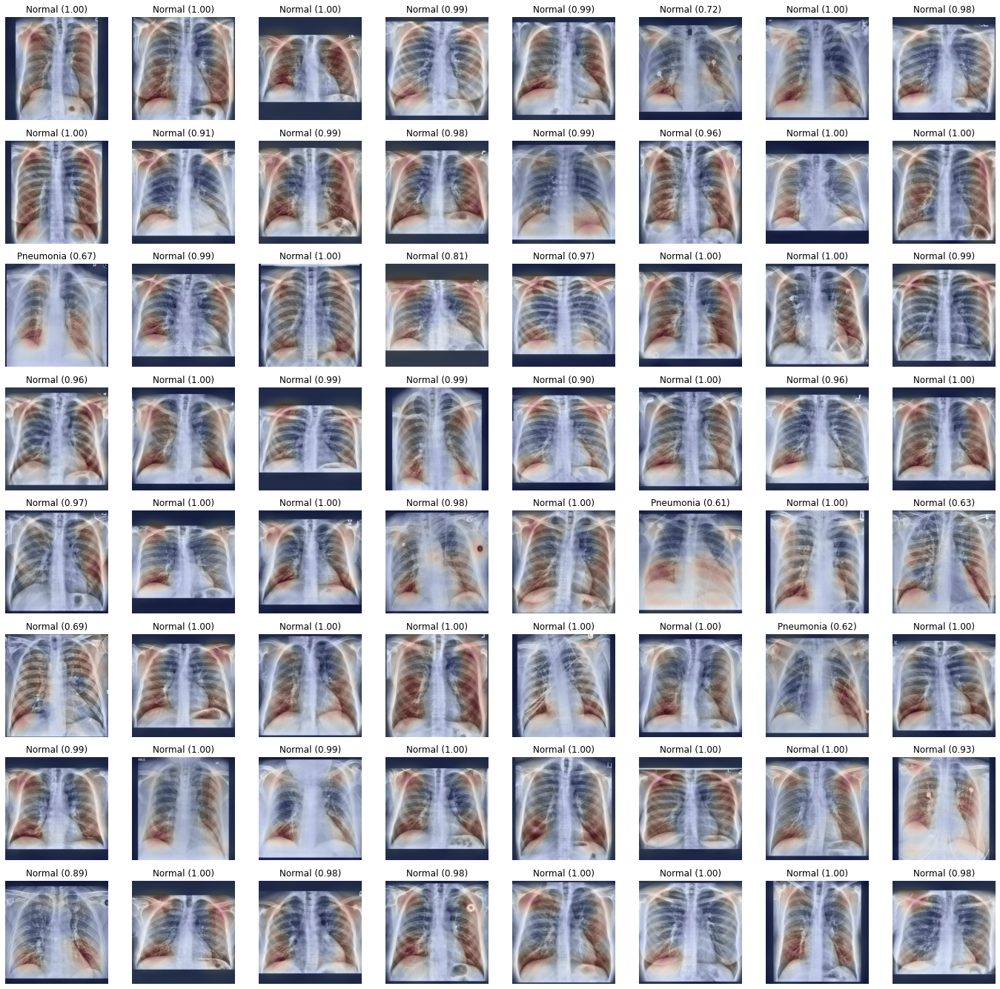

192 / 256


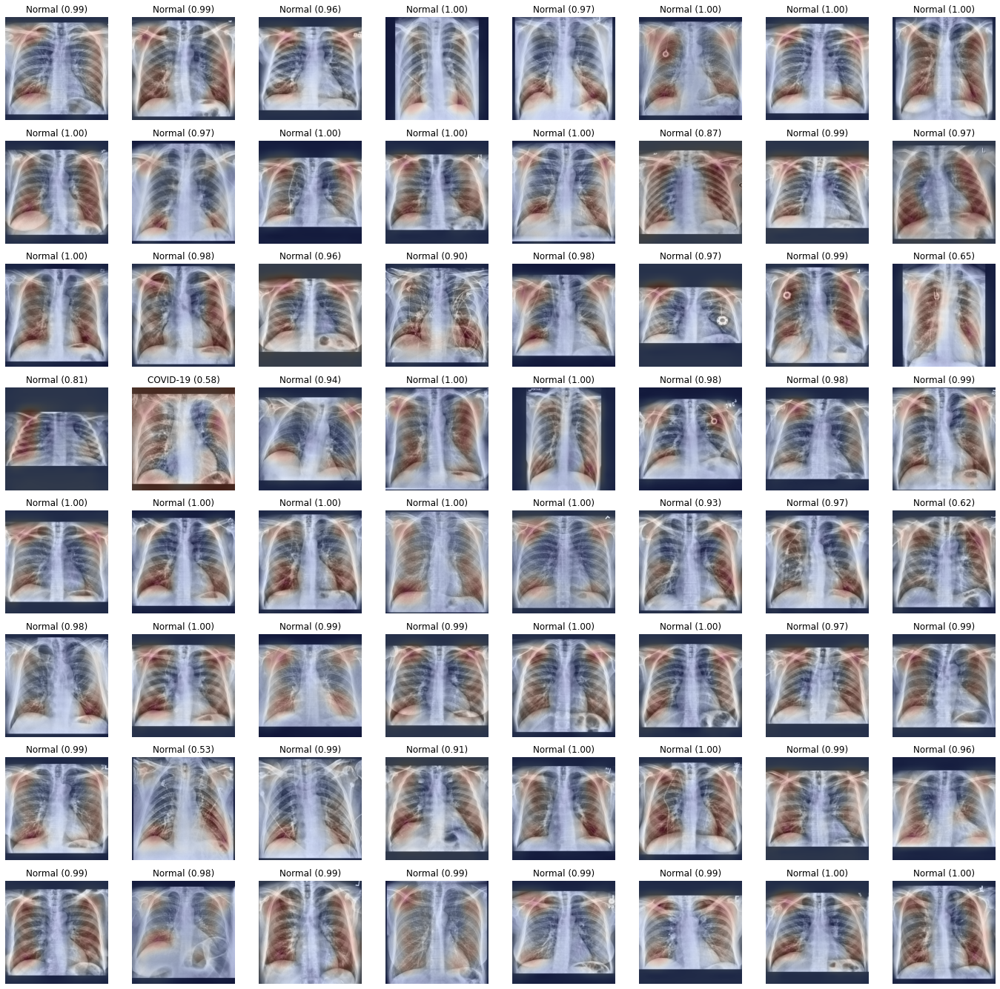

256 / 256


164043

In [5]:
vocab = classifier.dls[0].vocab
reverse_vocab = {v: i for i, v in enumerate(vocab)}
y = [reverse_vocab[parent_label(f)] for f in test_xrays[:n_files]]
p = []
confidence = []

def show_heatmaps(inputs, cams, classes, confs):
    n_rows = (len(classes) + 7) // 8
    fig, ax = plt.subplots(n_rows, 8, figsize=(24, n_rows * 3))
    
    for idx, (ip, cam, cl, conf) in enumerate(zip(inputs, cams, classes, confs)):
        imax, imin = ip.max(), ip.min()
        ip = (np.transpose(ip, (1, 2, 0)) - imin) / (imax - imin)
        heatmap = cv2.resize(
            cam.numpy(), ip.shape[:-1], interpolation=cv2.INTER_CUBIC
        )
        
        r, c = divmod(idx, 8)
        img = ip[:,:,1]
        ax[r][c].imshow(img, cmap="gray")
        ax[r][c].imshow(heatmap, cmap='coolwarm', interpolation='none', alpha=0.3)
        ax[r][c].set_title(f"{vocab[cl]} ({conf:.2f})")
        ax[r][c].axis("off")
    plt.show()
    plt.close(fig)

with HeatmapGenerator(classifier.model[0]) as hmgen:
    for i in range(0, n_files, step_size):
        i_end = min(i+step_size, n_files)

        xray_files = test_xrays[i:i_end]
        dl = classifier.dls.test_dl(xray_files, bs=step_size)

        for x, in dl:
            output = classifier.model.eval()(x)
            preds = F.softmax(output, dim=1)
            classes = preds.argmax(dim=1)
            conf = preds[np.arange(preds.shape[0]), classes].tolist()
            p.extend(classes.tolist())
            confidence.extend(conf)

#             output.backward(torch.ones_like(output))
            output.backward(output)
            cam_map = hmgen.get_heatmaps()
            show_heatmaps(x, cam_map, classes, conf)

        print(f"{i_end} / {n_files}")

del classifier
gc.collect()

In [6]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y, p, labels=[0,1,2])

array([[ 94,   4,   2],
       [  1, 152,   3],
       [  0,   0,   0]])